# 2. Classificação

A classificação é um método de aprendizado de máquina supervisionado em que o modelo tenta prever o rótulo correto de um determinado dado de entrada.

## Encoding

Alguns algoritmos mesmo que de classificação não conseguem compreender rótulos, apenas números, então é necessário transformar os dados categóricos utilizando técnicas codificação.

## Label Encoding

Cada categoria recebe um número, normalmente em ordem alfabética. Normalmente utilizado para dados categóricos ordinários.

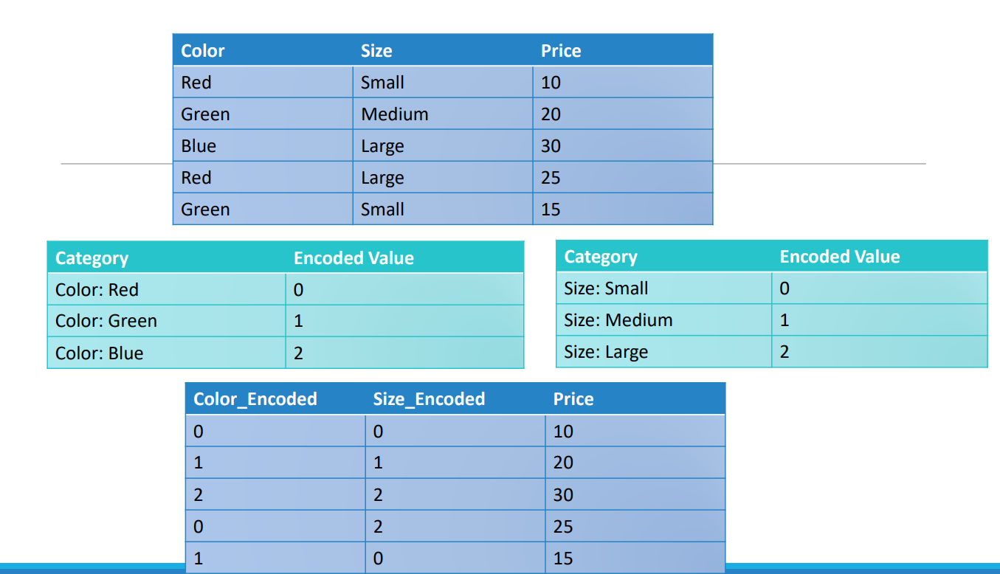

Dessa forma já é possível trabalhar com diversos algoritmos, no entanto alguns podem correlacionar os dados como uma ordem de grandeza. Isso acaba conferindo uma "importância" maior para categorias com um números maior. Nesses casos utilizamos outro encolder.

## One-hot Encoding

Cada categoria é transformada em outro atributo: dummy variable, um valor binário que informa a ocorrência.

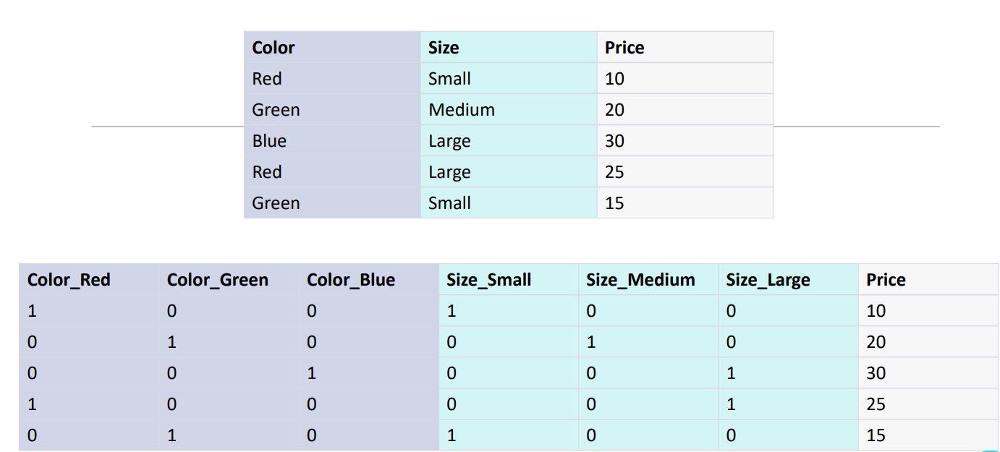

Temos que tomar cuidado com alguns fatores:
- Muitas colunas podem gerar um espaço de características de alta dimensão, que pode causar super ajuste e ter um custo computacional muito alto.
- Maldição da Dimensionaldiade: Dados esparços, muitas colunas com valor zero, tornando difícil
encontrar valores nos dados
- Dummy Variable Trap: valores de colunas binárias podem ser previstos a partir dos valores de outras colunas.

Solução: Excluir um dos atributos ou combinar colunas binárias

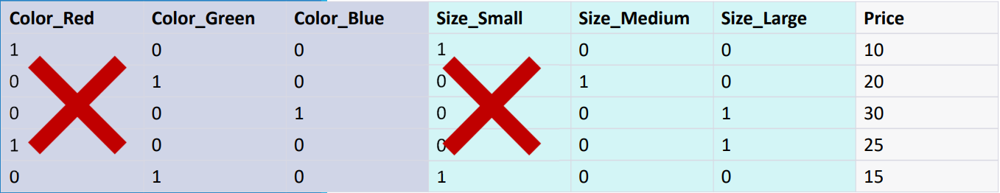

## Qual utilizar?

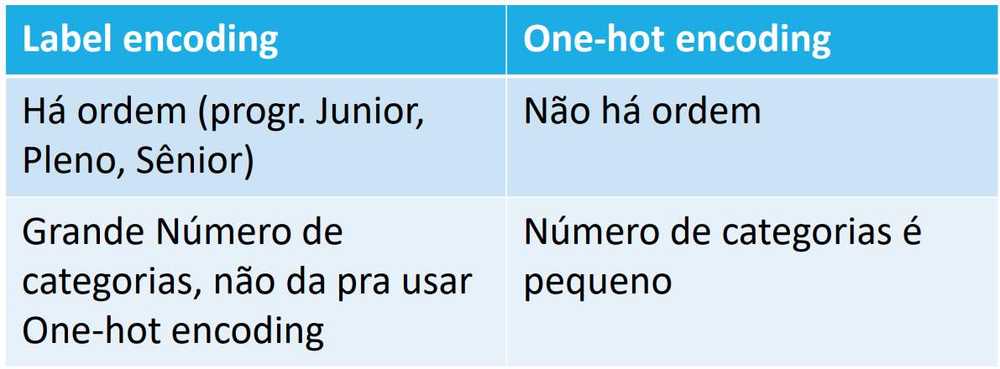

Vamos utilizar uma base de dados do censo para testarmos.

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

Agora diferente dos casos de regressão, na classificação temos diferentes tipos de variáveis e é importante distingui-las no dataset antes de começarmos a trabalhar.

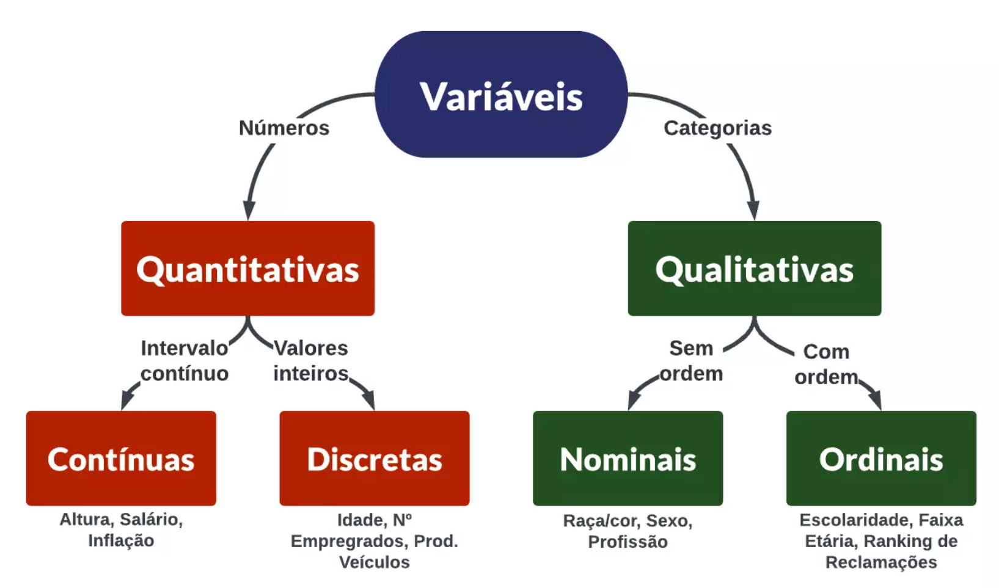



In [3]:
base_census = pd.read_csv('census.csv')
base_census

,age,workclass,final-weight,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loos,hour-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [4]:
base_census.describe()

,age,final-weight,education-num,capital-gain,capital-loos,hour-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [ ]:
base_census.isnull().sum()

Income é o nosso target, se refere a renda anual dos induvíduos do dataset, que se dividem em duas classes, as que ganham mais de 50 mil no ano e as que ganham menos.

In [5]:
np.unique(base_census['income'], return_counts=True)

(array([' <=50K', ' >50K'], dtype=object), array([24720,  7841]))

Podemos ver que majoritariamente os dados se referem a pessoas que ganham menos de 50 mil no ano.

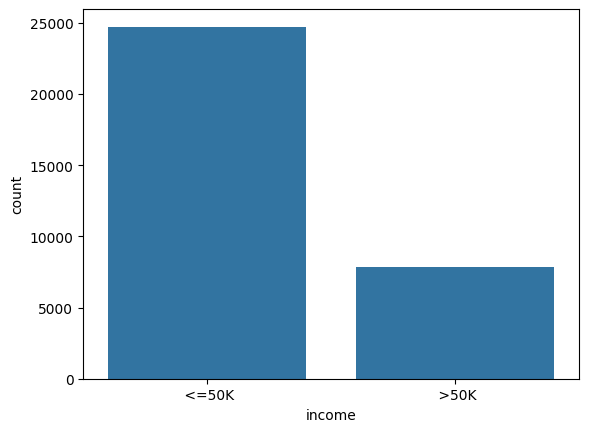

In [6]:
sns.countplot(x = base_census['income'])

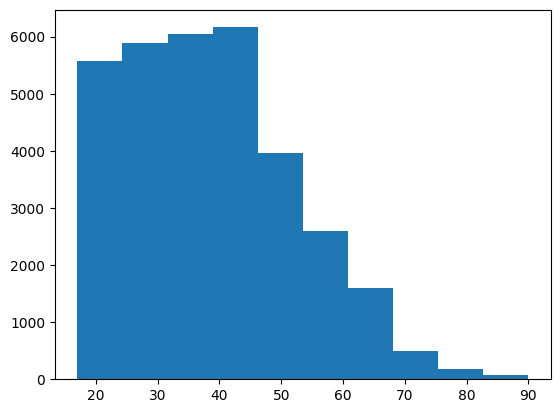

In [7]:
plt.hist(x = base_census['age']);

Podemos ver que a maioria tem entre 8 a 12 anos de dedicação aos estudos.

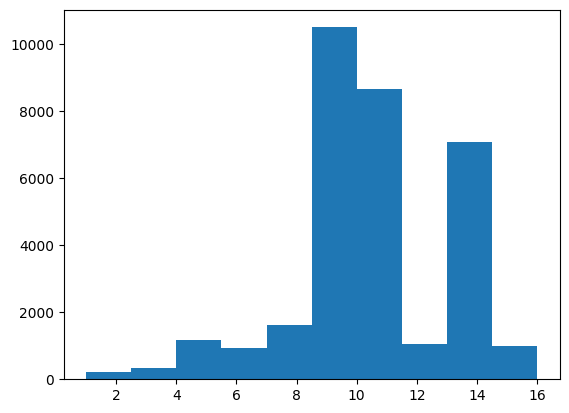

In [8]:
plt.hist(x = base_census['education-num']);

E trabalham de 30 a 40 horas por semana.

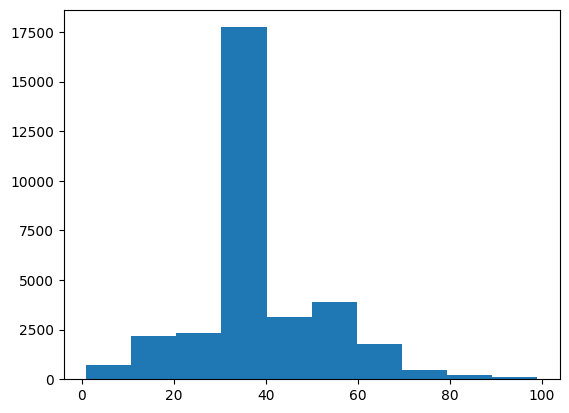

In [9]:
plt.hist(x = base_census['hour-per-week']);

Podemos observar a distribuição por categoria utilizando o gráfico treemap da biblioteca plotly.

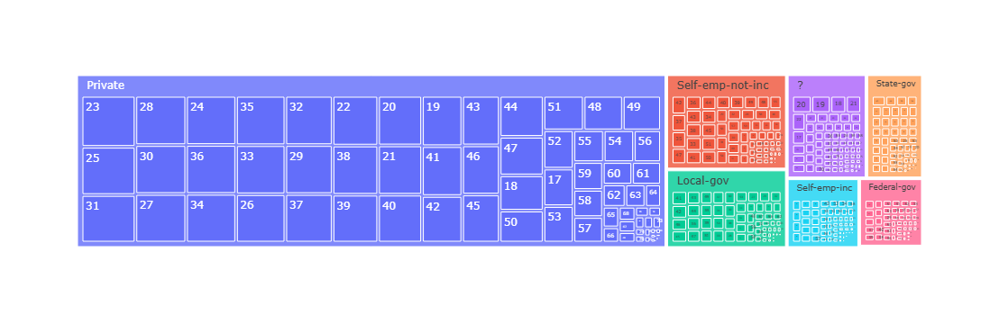

In [10]:
grafico = px.treemap(base_census, path=['workclass', 'age'])
grafico.show()

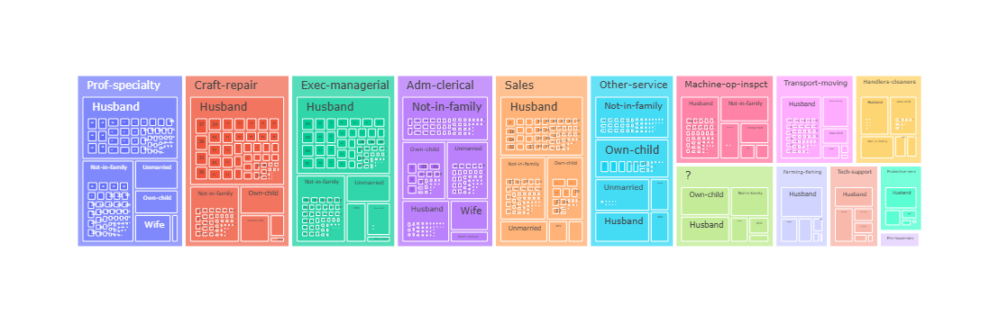

In [11]:
grafico = px.treemap(base_census, path=['occupation', 'relationship','age'])
grafico.show()

Assim como podemos ver a relação entre as categorias.

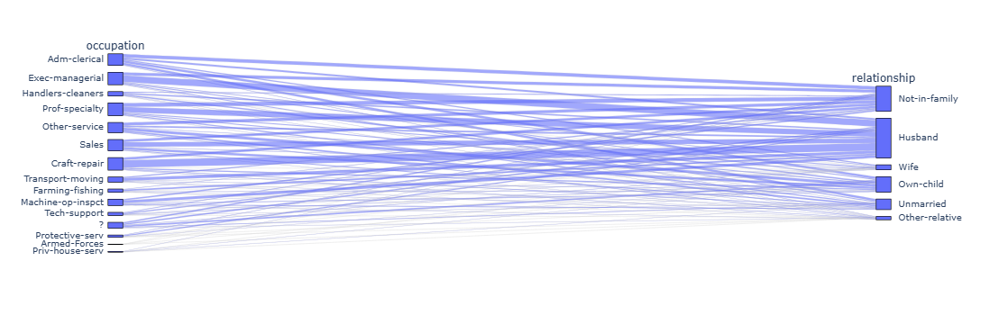

In [12]:
grafico = px.parallel_categories(base_census, dimensions=['occupation', 'relationship'])
grafico.show()

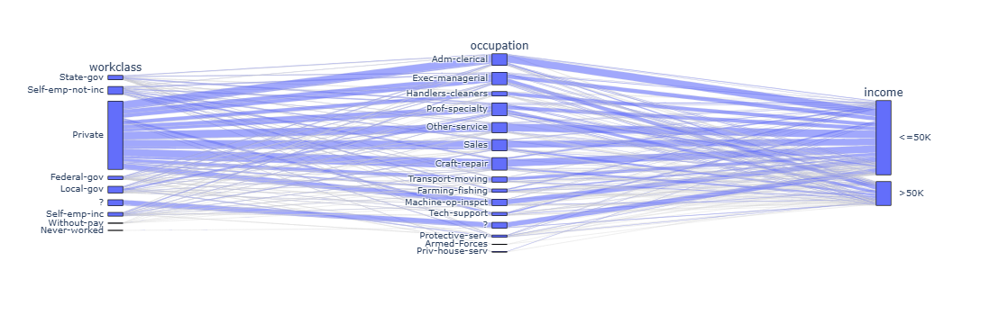

In [13]:
grafico = px.parallel_categories(base_census, dimensions=['workclass', 'occupation', 'income'])
grafico.show()

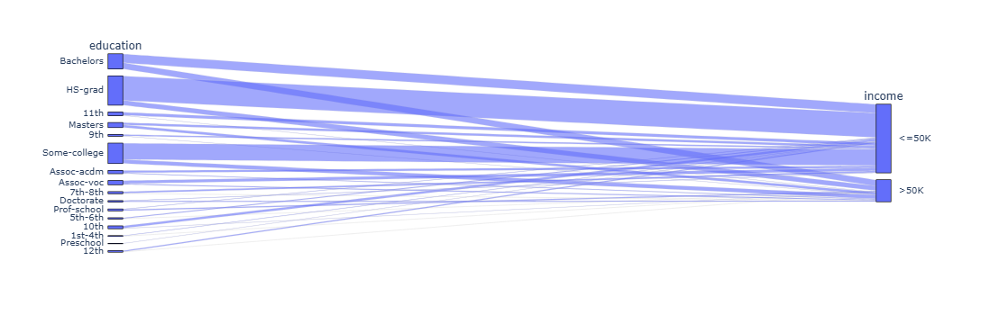

In [14]:
grafico = px.parallel_categories(base_census, dimensions=['education', 'income'])
grafico.show()

In [15]:
base_census.columns

Index(['age', 'workclass', 'final-weight', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loos', 'hour-per-week', 'native-country',
       'income'],
      dtype='object')

Vamos dividir os nossos dados entre target e as variáveis exploratórias.

In [16]:
X_census = base_census.iloc[:, 0:14].values
y_census = base_census.iloc[:, 14].values

Conforme estudamos anteriormente, quando se tratam de dados categóricos é necessário transformar os rótulos em numéricos para melhor compreensão do algoritmo.

In [17]:
from sklearn.preprocessing import LabelEncoder
label_encoder_teste = LabelEncoder()
X_census[:,1]

array([' State-gov', ' Self-emp-not-inc', ' Private', ..., ' Private',
       ' Private', ' Self-emp-inc'], dtype=object)

In [18]:
teste = label_encoder_teste.fit_transform(X_census[:,1])
teste

array([7, 6, 4, ..., 4, 4, 5])

In [19]:
X_census[0]

array([39, ' State-gov', 77516, ' Bachelors', 13, ' Never-married',
       ' Adm-clerical', ' Not-in-family', ' White', ' Male', 2174, 0, 40,
       ' United-States'], dtype=object)

In [20]:
label_encoder_workclass = LabelEncoder()
label_encoder_education = LabelEncoder()
label_encoder_marital = LabelEncoder()
label_encoder_occupation = LabelEncoder()
label_encoder_relationship = LabelEncoder()
label_encoder_race = LabelEncoder()
label_encoder_sex = LabelEncoder()
label_encoder_country = LabelEncoder()

In [21]:
X_census[:,1] = label_encoder_workclass.fit_transform(X_census[:,1])
X_census[:,3] = label_encoder_education.fit_transform(X_census[:,3])
X_census[:,5] = label_encoder_marital.fit_transform(X_census[:,5])
X_census[:,6] = label_encoder_occupation.fit_transform(X_census[:,6])
X_census[:,7] = label_encoder_relationship.fit_transform(X_census[:,7])
X_census[:,8] = label_encoder_race.fit_transform(X_census[:,8])
X_census[:,9] = label_encoder_sex.fit_transform(X_census[:,9])
X_census[:,13] = label_encoder_country.fit_transform(X_census[:,13])

In [22]:
X_census[0]

array([39, 7, 77516, 9, 13, 4, 1, 1, 4, 1, 2174, 0, 40, 39], dtype=object)

In [23]:
X_census

array([[39, 7, 77516, ..., 0, 40, 39],
       [50, 6, 83311, ..., 0, 13, 39],
       [38, 4, 215646, ..., 0, 40, 39],
       ...,
       [58, 4, 151910, ..., 0, 40, 39],
       [22, 4, 201490, ..., 0, 20, 39],
       [52, 5, 287927, ..., 0, 40, 39]], dtype=object)

In [24]:
len(np.unique(base_census['occupation']))

15

In [25]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

onehotencoder_census = ColumnTransformer(transformers=[('OneHot', OneHotEncoder(), [1,3,5,6,7,8,9,13])], remainder='passthrough')

In [27]:
X_census = onehotencoder_census.fit_transform(X_census)
X_census[0]

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 13 stored elements and shape (1, 108)>

In [28]:
X_census.shape

(32561, 108)

In [31]:
from sklearn.preprocessing import StandardScaler
scaler_census = StandardScaler(with_mean=False)
X_census = scaler_census.fit_transform(X_census)
X_census[0]

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 13 stored elements and shape (1, 108)>

In [117]:
from sklearn.model_selection import train_test_split

X_census_treinamento, X_census_teste, y_census_treinamento, y_census_teste = train_test_split(X_census, y_census, test_size = 0.2, random_state = 0)

X_census_treinamento.shape, X_census_teste.shape

((26048, 108), (6513, 108))

In [118]:
import pickle
with open('census.pkl', mode = 'wb') as f:
  pickle.dump([X_census_treinamento, y_census_treinamento, X_census_teste, y_census_teste], f)

## Naïve Bayes

O algoritmo assume a premissa "ingênua" de que todas as características de entrada são independentes da presença umas das outras, dado a classe.Ele aplica o teorema de bayes para calcular a probabilidade de um dado pertencer a uma classe específica. A fórmula essencial é:

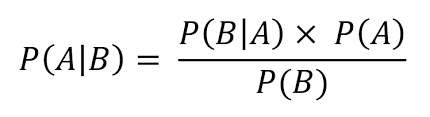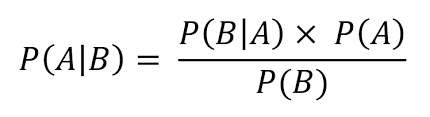

Onde A é cada classe e B os a quantidade de Dados.

Na prática temos uma base de dados original:

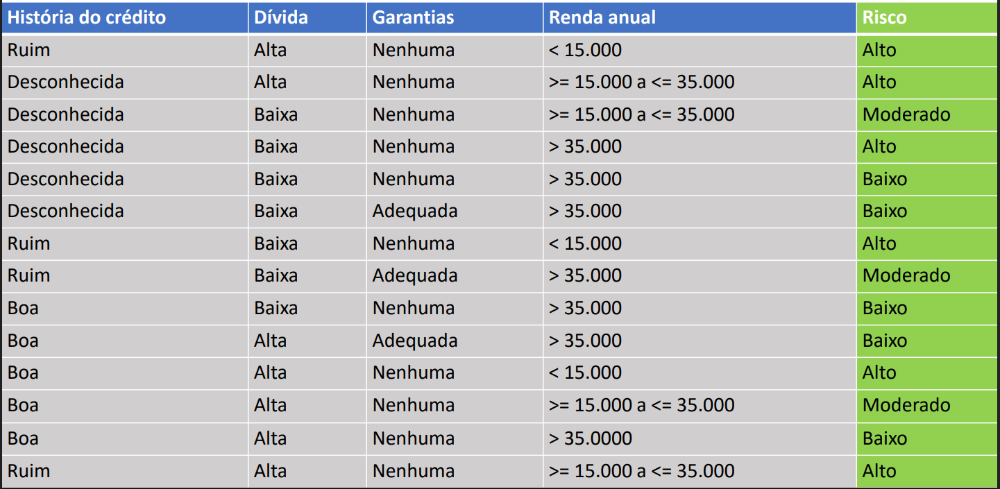

E para cada feature faz a divisão relacionada com a classe que queremos prever:

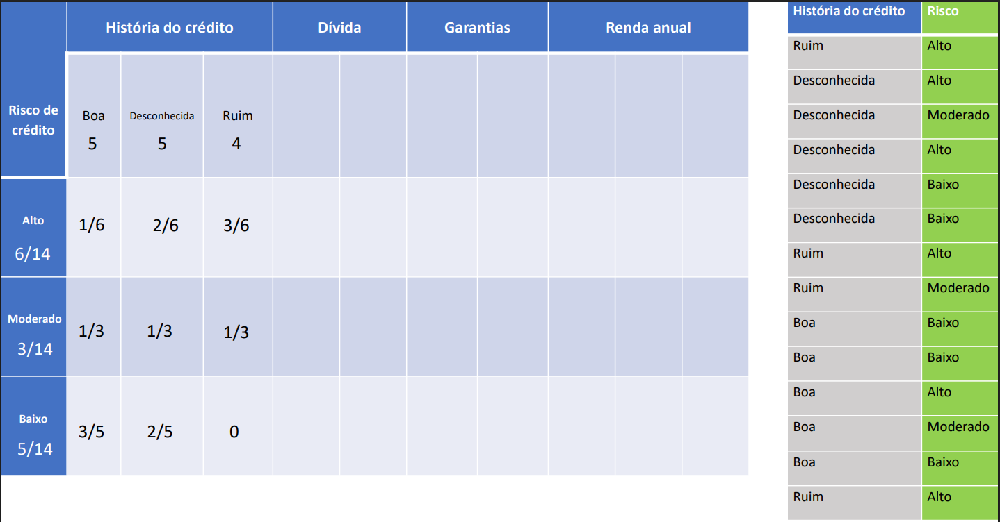

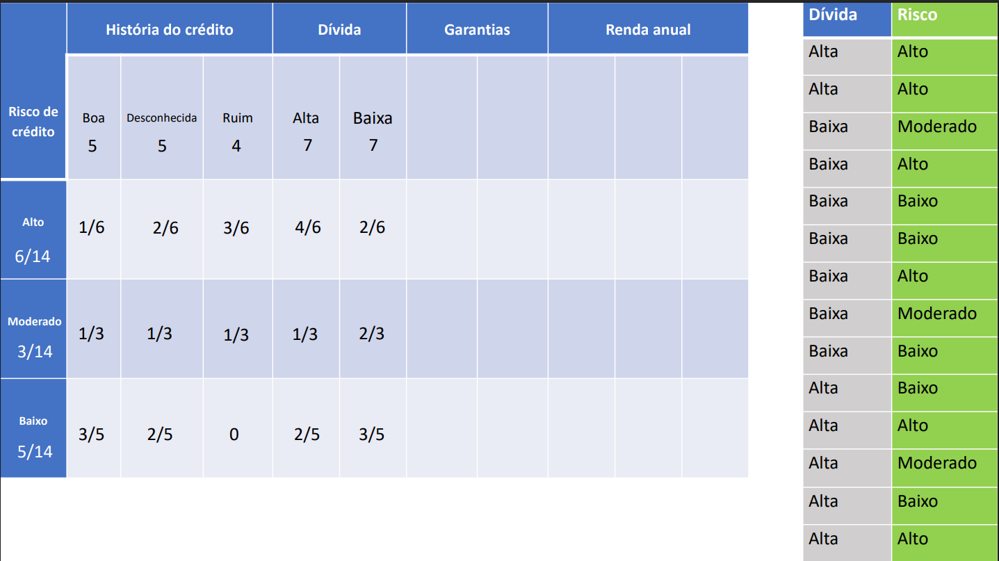

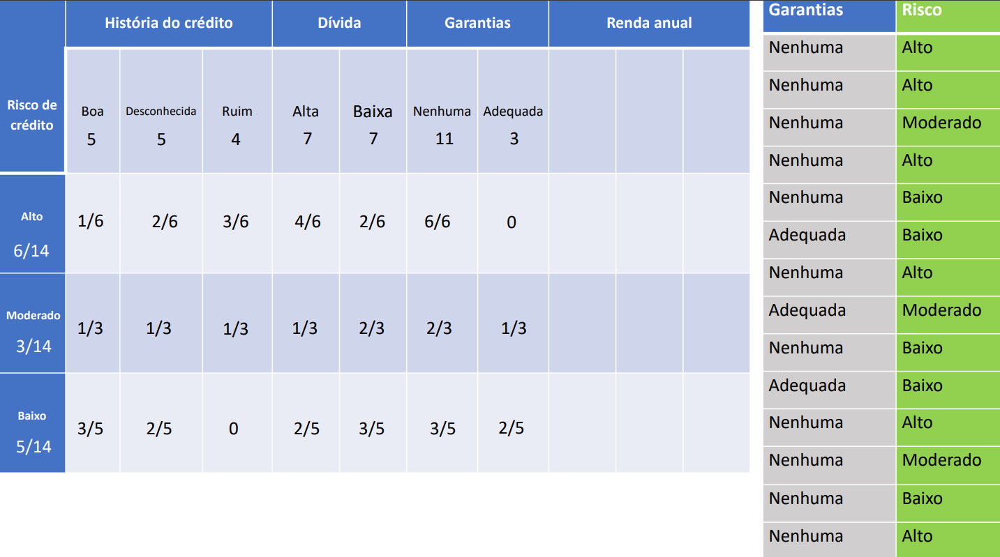

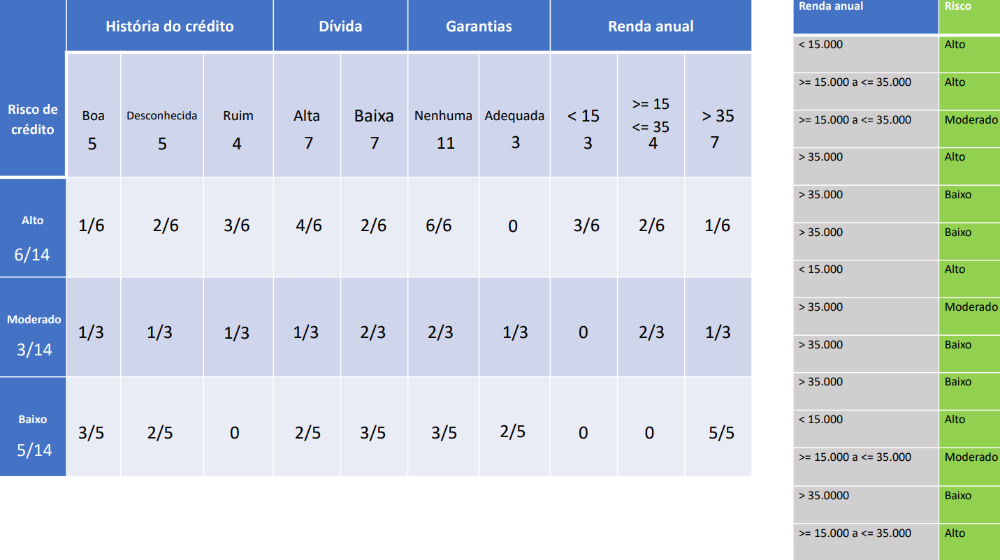

Essa tabela pronta é o que vai gerar o aprendizado do algoritmo, a partir disso podemos prever novos valores com os cálculos de probabilidade de cada classe.

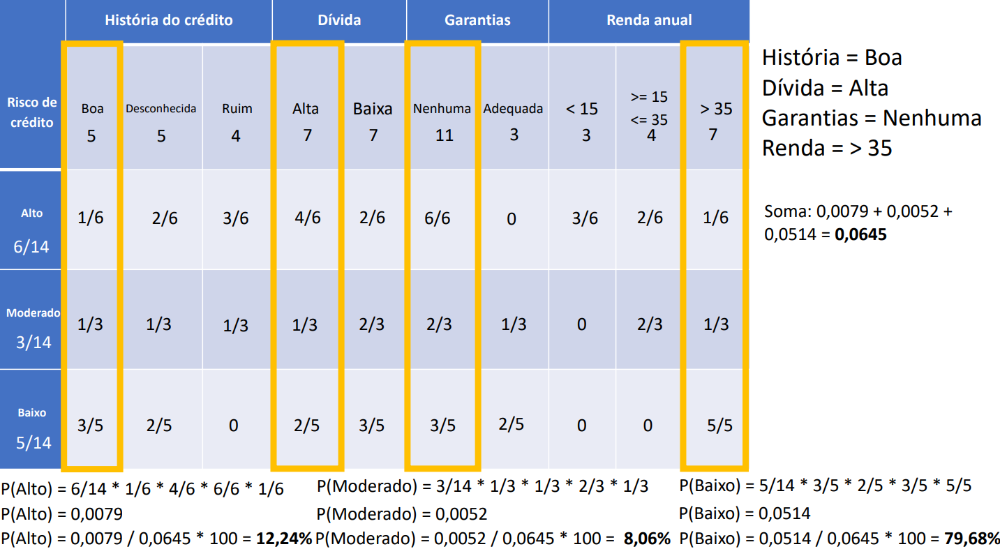




## Métricas de desempenho para classificação.

Para avaliar as métricas abaixo considere que:

*tp* = True Positive; Quantidade de dados que eram de uma classe e foram preditas corretamente.

*tn* = True Negative. Quantidade de dados que não eram de um classe e foram preditas corretamente.

*fp* = False Positiive. Quantidade de dados que eram de uma classe e foram preditas incorretamente.

*fn* = False Negative. Quantidade de dados que não eram de uma classe e foram preditas incorretamente


## Acurácia
Mede a porcentagem/proporção de valores que foram preditos de forma correta. ((tp + tn) / (tp + tn + fp + fn))

## Precisão
Retorna a proporção de todos os dados que foram predições corretas apenas para quais seu modelo apontou como verdadeiras. (tp / (tp + fp)

## Recall
Retorna a proporção de todos os dados que eram de fato verdadeiras e quantas foram corretamente preditas como positiva. (tp / (tp + fn).


## F1_SCORE
Ele é a média harmônica entre a precisão e o recall. 2(precisao*recall/precisao+recall)


## Matriz de confusão
Mostra a matriz de confusão (tp, tn, fp, fn). Funciona para quando a mais de duas classes, mostrando nas linhas o que realmente existia e nas colunas o que foi previsto.


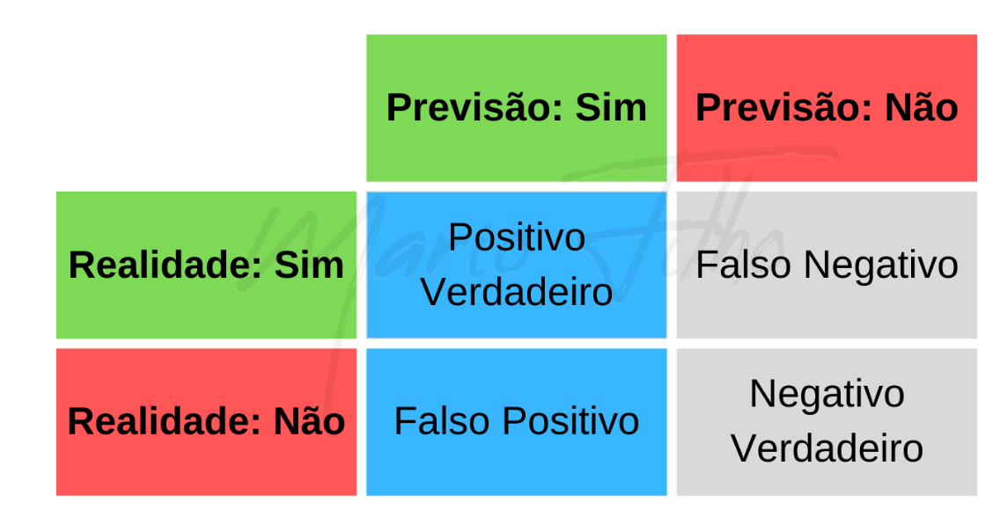

Vamos testar, como os dados foram tratados anteriormente para não termos que rodar toda vez esses tratamentos podemos salvar os dados tratados num arquivo pkl, PKL é um arquivo binário gerado pelo módulo pickle do Python para serializar (salvar) um objeto Python. Isso permite que objetos complexos, como modelos de aprendizado de máquina ou estruturas de dados.

In [119]:
from sklearn.naive_bayes import GaussianNB
import pickle
with open('census.pkl', 'rb') as f:
  X_census_treinamento, y_census_treinamento, X_census_teste, y_census_teste = pickle.load(f)

naive_census = GaussianNB()
naive_census.fit(X_census_treinamento.toarray(), y_census_treinamento)
previsoes = naive_census.predict(X_census_teste.toarray())
previsoes

array([' >50K', ' >50K', ' >50K', ..., ' >50K', ' >50K', ' >50K'],
      dtype='<U6')

In [120]:
y_census_teste

array([' <=50K', ' <=50K', ' <=50K', ..., ' >50K', ' <=50K', ' >50K'],
      dtype=object)

In [121]:
from sklearn.metrics import accuracy_score, classification_report
accuracy_score(y_census_teste, previsoes)

0.4818056195301704

0.4818056195301704

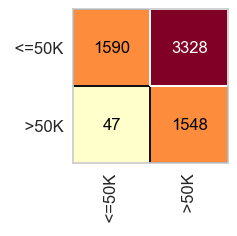

In [122]:
from yellowbrick.classifier import ConfusionMatrix
plt.figure(figsize=(2,2))
cm = ConfusionMatrix(naive_census)
cm.fit(X_census_treinamento.toarray(), y_census_treinamento)
cm.score(X_census_teste.toarray(), y_census_teste)

In [123]:
print(classification_report(y_census_teste, previsoes))

              precision    recall  f1-score   support

       <=50K       0.97      0.32      0.49      4918
        >50K       0.32      0.97      0.48      1595

    accuracy                           0.48      6513
   macro avg       0.64      0.65      0.48      6513
weighted avg       0.81      0.48      0.48      6513



## Árvore de Decisão

In [165]:
from sklearn.tree import DecisionTreeClassifier,plot_tree
with open('census.pkl', 'rb') as f:
  X_census_treinamento, y_census_treinamento, X_census_teste, y_census_teste = pickle.load(f)

In [168]:
from mlxtend.plotting import plot_decision_regions

clf = DecisionTreeClassifier(max_depth=3)
clf.fit(X_census_treinamento, y_census_treinamento)

,criterion,'gini'
,splitter,'best'
,max_depth,3
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


A árvore de decisão tem como objetivo prever se uma pessoa ganha mais ou menos de 50 mil dólares por ano (classes <=50K e >50K).

Cada nó representa uma decisão baseada em uma variável (feature), e o modelo segue essas divisões até chegar em uma folha, que indica o resultado final da previsão.Em cada nó, o gráfico apresenta:

- Feature usada na divisão: variável que define o ponto de separação entre os grupos (ex.: relationship <= -0.589).
- Gini: mede o nível de impureza do nó; quanto mais próximo de 0, mais homogêneo é o grupo.
- Samples: quantidade de exemplos (linhas) que chegaram a esse nó.
- Value = [x, y]: número de amostras de cada classe (<=50K e >50K).
- Class: classe predominante entre as amostras daquele nó, ou seja, a previsão que o modelo faz para esse grupo.

In [126]:
X_census_treinamento.shape, y_census_treinamento.shape

((26048, 108), (26048,))

In [127]:
X_census_teste.shape, y_census_teste.shape

((6513, 108), (6513,))

In [128]:
arvore_census = DecisionTreeClassifier(criterion='entropy', random_state=0)
arvore_census.fit(X_census_treinamento, y_census_treinamento)


,criterion,'entropy'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [129]:
previsoes = arvore_census.predict(X_census_teste)
previsoes

array([' <=50K', ' <=50K', ' <=50K', ..., ' >50K', ' <=50K', ' >50K'],
      dtype=object)

In [130]:
accuracy_score(y_census_teste, previsoes)

0.8088438507600184

0.8088438507600184

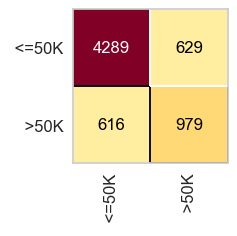

In [131]:
from yellowbrick.classifier import ConfusionMatrix
plt.figure(figsize=(2,2))
cm = ConfusionMatrix(arvore_census)
cm.fit(X_census_treinamento, y_census_treinamento)
cm.score(X_census_teste, y_census_teste)

In [132]:
print(classification_report(y_census_teste, previsoes))

              precision    recall  f1-score   support

       <=50K       0.87      0.87      0.87      4918
        >50K       0.61      0.61      0.61      1595

    accuracy                           0.81      6513
   macro avg       0.74      0.74      0.74      6513
weighted avg       0.81      0.81      0.81      6513



## Random Forest

In [133]:
from sklearn.ensemble import RandomForestClassifier

In [134]:
with open('census.pkl', 'rb') as f:
  X_census_treinamento, y_census_treinamento, X_census_teste, y_census_teste = pickle.load(f)

In [135]:
X_census_treinamento.shape, y_census_treinamento.shape

((26048, 108), (26048,))

In [136]:
X_census_teste.shape, y_census_teste.shape

((6513, 108), (6513,))

In [137]:
y_census_treinamento

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' >50K', ' <=50K'],
      dtype=object)

In [138]:
random_forest_census = RandomForestClassifier(n_estimators=100, criterion='entropy', random_state = 0)
random_forest_census.fit(X_census_treinamento, y_census_treinamento)

,n_estimators,100
,criterion,'entropy'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [139]:
previsoes = random_forest_census.predict(X_census_teste)
previsoes

array([' <=50K', ' <=50K', ' <=50K', ..., ' >50K', ' <=50K', ' >50K'],
      dtype=object)

In [140]:
y_census_teste

array([' <=50K', ' <=50K', ' <=50K', ..., ' >50K', ' <=50K', ' >50K'],
      dtype=object)

In [141]:
accuracy_score(y_census_teste, previsoes)

0.8518347919545525

0.8518347919545525

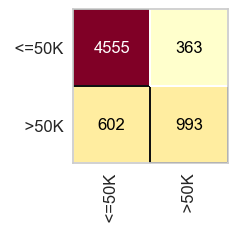

In [142]:
plt.figure(figsize=(2,2))
cm = ConfusionMatrix(random_forest_census)
cm.fit(X_census_treinamento, y_census_treinamento)
cm.score(X_census_teste, y_census_teste)

In [143]:
print(classification_report(y_census_teste, previsoes))

              precision    recall  f1-score   support

       <=50K       0.88      0.93      0.90      4918
        >50K       0.73      0.62      0.67      1595

    accuracy                           0.85      6513
   macro avg       0.81      0.77      0.79      6513
weighted avg       0.85      0.85      0.85      6513



## KNN (K-Nearest Neighbors)

“K Vizinhos Mais Próximos” — é um algoritmo simples de classificação, que classifica um novo dado olhando quem são os vizinhos mais próximos dele. Onde o valor de K determina o número de vizinhos que o modelo vai considerar.

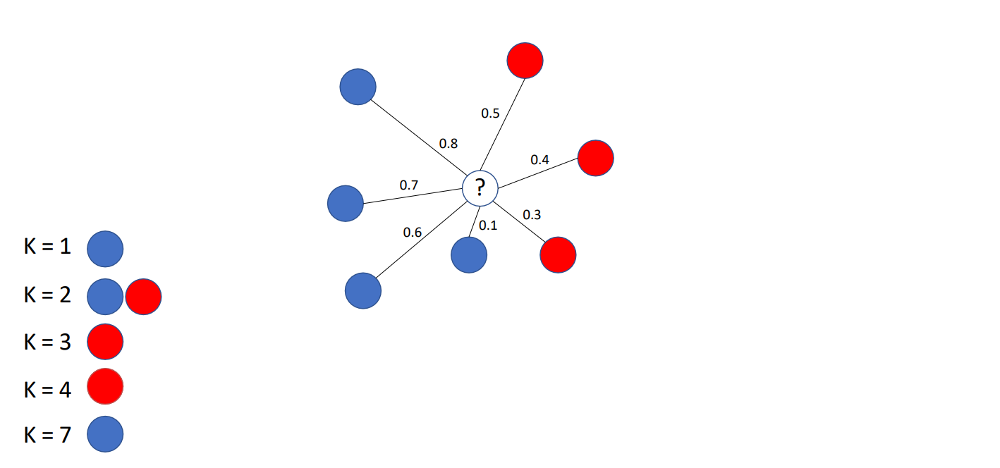

Calcula a distância entre o novo ponto e todos os pontos do conjunto de treinamento (geralmente usa-se a distância Euclidiana).

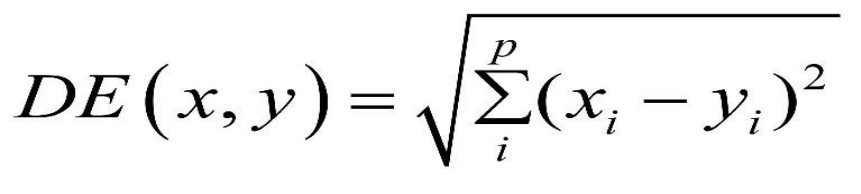

Pega os K vizinhos mais próximos (os que têm menor distância).

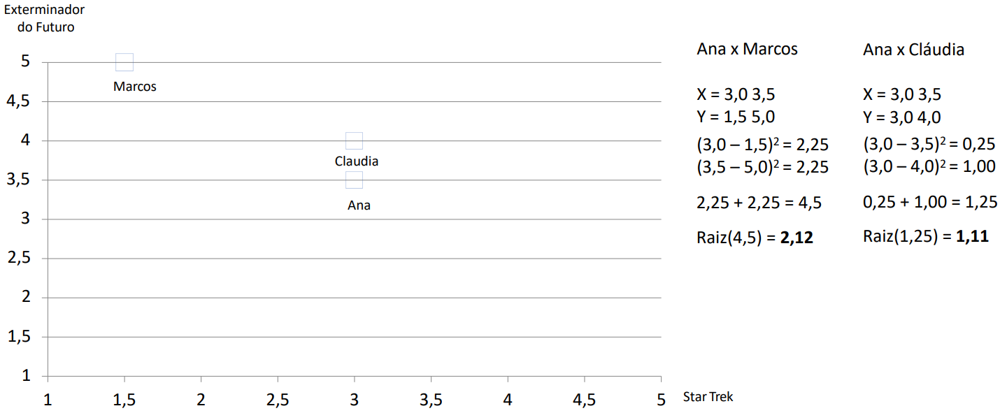

O modelo escolhe a classe mais frequente entre os vizinhos. 

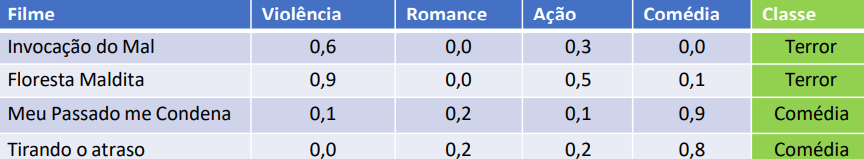


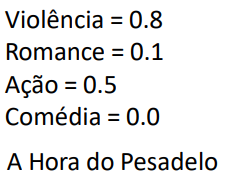

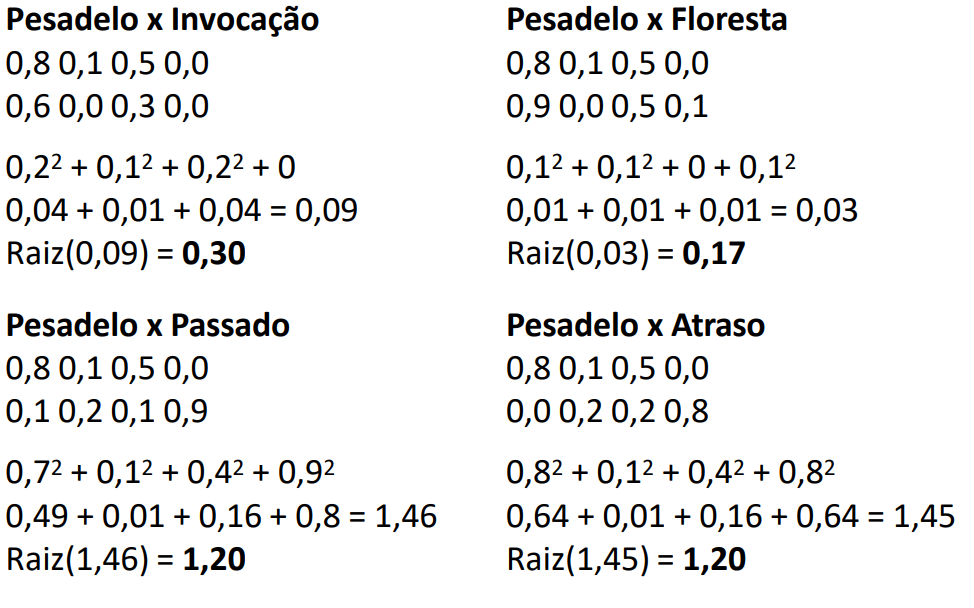

Importante ressaltar que nesse algoritmo não é criado um modelo, e sim a memorização dos dados vizinhos e calcula as distâncias para determinar a classe.

Obs.: É impressindível a utilização do StandardScaler para que escalas maiores não prejudiquem os cálculos.

In [144]:
from sklearn.neighbors import KNeighborsClassifier

In [145]:
with open('census.pkl', 'rb') as f:
  X_census_treinamento, y_census_treinamento, X_census_teste, y_census_teste = pickle.load(f)

In [146]:
X_census_treinamento.shape, y_census_treinamento.shape

((26048, 108), (26048,))

In [147]:
X_census_teste.shape, y_census_teste.shape

((6513, 108), (6513,))

In [148]:
knn_census = KNeighborsClassifier(n_neighbors=10)
knn_census.fit(X_census_treinamento, y_census_treinamento)

,n_neighbors,10
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [149]:
previsoes = knn_census.predict(X_census_teste)
previsoes

array([' <=50K', ' <=50K', ' <=50K', ..., ' >50K', ' <=50K', ' >50K'],
      dtype=object)

In [150]:
y_census_teste

array([' <=50K', ' <=50K', ' <=50K', ..., ' >50K', ' <=50K', ' >50K'],
      dtype=object)

In [151]:
accuracy_score(y_census_teste, previsoes)

0.8263473053892215

0.8263473053892215

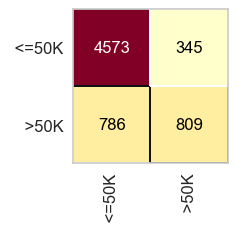

In [152]:
plt.figure(figsize=(2,2))
cm = ConfusionMatrix(knn_census)
cm.fit(X_census_treinamento, y_census_treinamento)
cm.score(X_census_teste, y_census_teste)

In [153]:
print(classification_report(y_census_teste, previsoes))

              precision    recall  f1-score   support

       <=50K       0.85      0.93      0.89      4918
        >50K       0.70      0.51      0.59      1595

    accuracy                           0.83      6513
   macro avg       0.78      0.72      0.74      6513
weighted avg       0.82      0.83      0.82      6513



## Regressão Logística

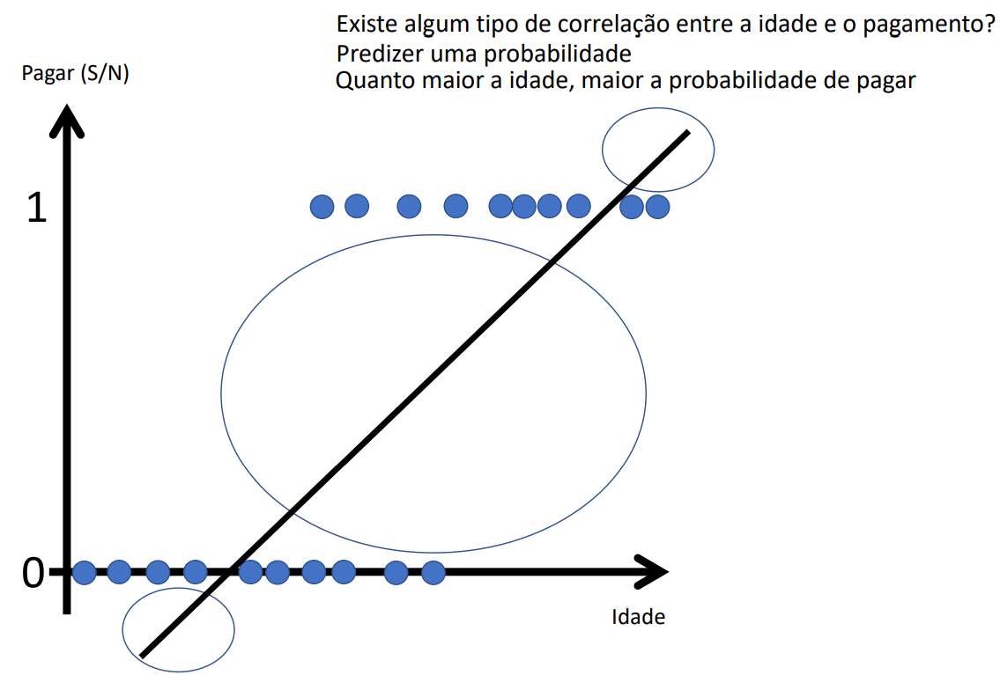

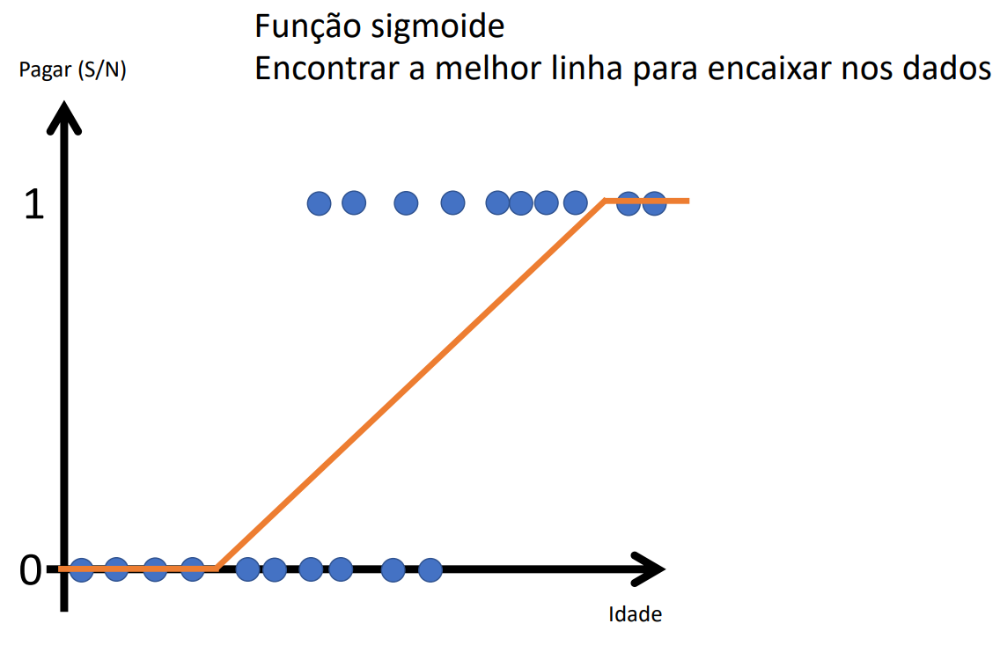


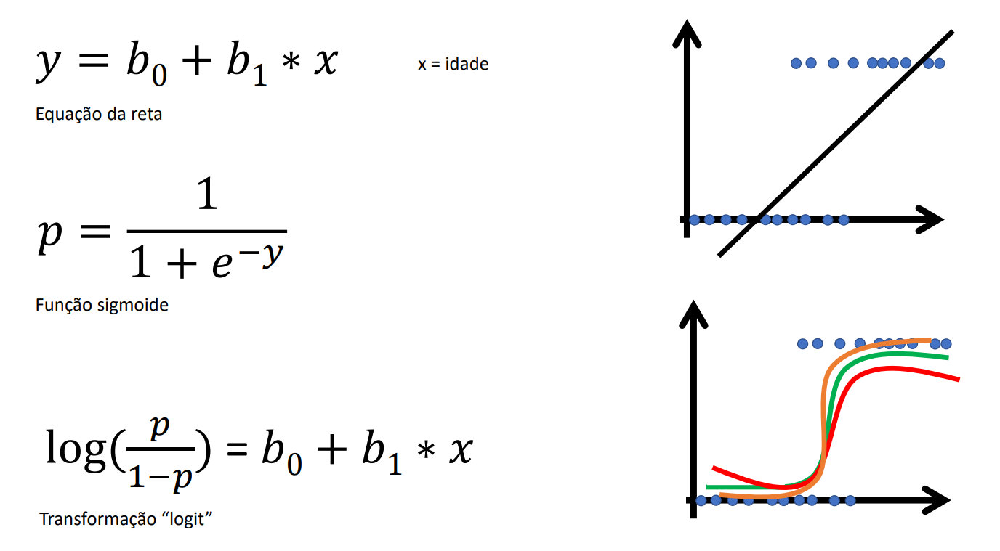

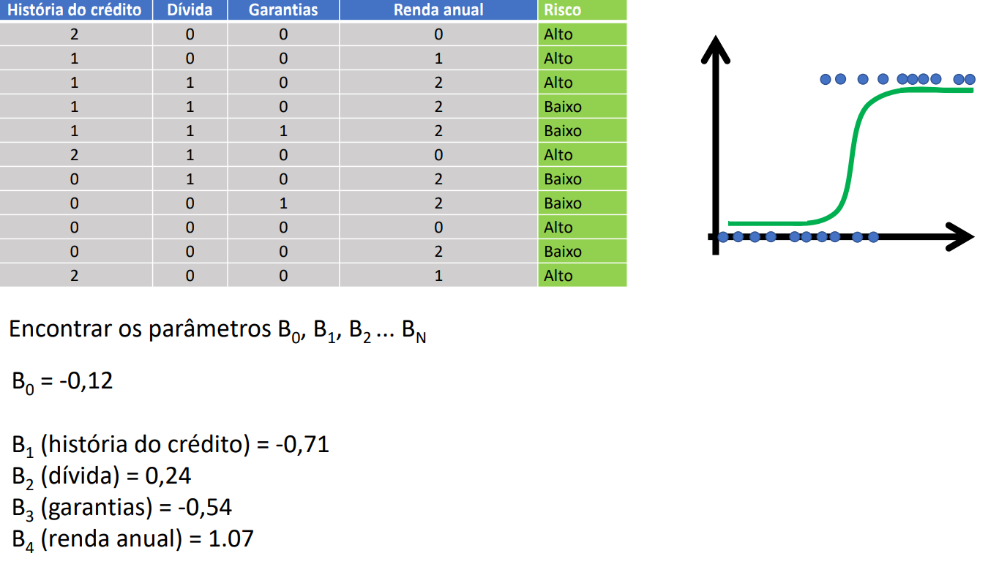

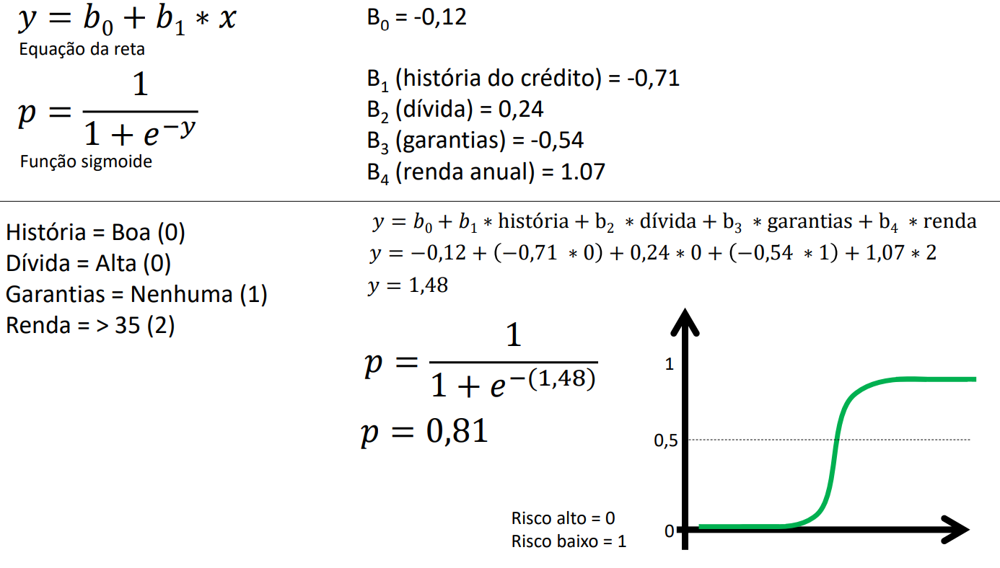


In [154]:
from sklearn.linear_model import LogisticRegression

In [155]:
with open('census.pkl', 'rb') as f:
  X_census_treinamento, y_census_treinamento, X_census_teste, y_census_teste = pickle.load(f)

In [156]:
X_census_treinamento.shape, y_census_treinamento.shape

((26048, 108), (26048,))

In [157]:
X_census_teste.shape, y_census_teste.shape

((6513, 108), (6513,))

In [158]:
logistic_census = LogisticRegression(random_state = 1,max_iter=100)
logistic_census.fit(X_census_treinamento, y_census_treinamento)

,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,1
,solver,'lbfgs'
,max_iter,100
,multi_class,'deprecated'


In [159]:
previsoes = logistic_census.predict(X_census_teste)
previsoes

array([' <=50K', ' <=50K', ' <=50K', ..., ' >50K', ' <=50K', ' <=50K'],
      dtype=object)

In [160]:
y_census_teste

array([' <=50K', ' <=50K', ' <=50K', ..., ' >50K', ' <=50K', ' >50K'],
      dtype=object)

In [161]:
accuracy_score(y_census_teste, previsoes)

0.84692154153232

0.84692154153232

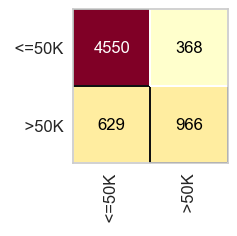

In [162]:
plt.figure(figsize=(2,2))
cm = ConfusionMatrix(logistic_census)
cm.fit(X_census_treinamento, y_census_treinamento)
cm.score(X_census_teste, y_census_teste)